In [2]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import LocallyLinearEmbedding, SpectralEmbedding, Isomap
import time
from sklearn.cluster import SpectralClustering
from sklearn.metrics.cluster import homogeneity_score
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestCentroid
from sklearn.metrics import accuracy_score

In [3]:
data=pd.read_csv("./microbes.csv")

In [4]:
#parathroume omws oti h 1h sthlh einai unnamed kai de xreiazetai opote thn afairoume
data = data.drop(['Unnamed: 0'], axis = 1)

In [5]:
data.shape

(30527, 25)

In [6]:
data

,Solidity,Eccentricity,EquivDiameter,Extrema,FilledArea,Extent,Orientation,EulerNumber,BoundingBox1,BoundingBox2,...,ConvexHull4,MajorAxisLength,MinorAxisLength,Perimeter,ConvexArea,Centroid1,Centroid2,Area,raddi,microorganisms
0,10.70,15.8,5.43,3.75,0.7850,8.14,2.15,22.3,2.97,10.90,...,2.97,1.340,1.610,0.683,0.1950,3.63,12.10,1.310,7.99,Spirogyra
1,5.60,18.3,4.14,6.16,0.3640,3.51,18.60,22.5,5.41,19.20,...,5.47,1.520,1.520,1.010,0.2150,6.01,20.60,0.765,7.99,Spirogyra
2,8.32,19.8,4.63,6.66,0.4150,5.85,21.00,22.4,5.96,10.20,...,5.96,1.630,1.380,1.110,0.1820,6.55,11.50,0.953,7.99,Spirogyra
3,10.10,17.9,7.29,11.10,1.4700,6.30,9.94,21.9,8.81,10.70,...,8.88,2.040,2.120,0.715,0.3710,10.30,12.00,2.340,7.99,Spirogyra
4,6.27,20.2,20.10,10.70,14.7000,3.97,2.58,11.9,10.20,1.22,...,10.20,7.780,6.210,6.800,4.4400,14.00,9.55,17.600,7.99,Spirogyra
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30522,3.01,22.6,4.90,20.00,0.4340,1.40,19.90,22.1,18.10,9.92,...,18.60,4.350,1.350,1.710,0.5490,19.10,13.20,1.070,7.15,Ulothrix
30523,5.19,22.6,2.07,19.40,0.0788,1.67,5.09,22.8,19.20,16.20,...,20.00,1.460,0.411,0.458,0.0597,19.80,17.20,0.197,7.15,Ulothrix
30524,9.21,22.7,2.07,21.00,0.0790,5.81,12.70,22.8,20.10,11.40,...,20.10,1.060,0.257,0.319,0.0341,20.70,11.60,0.198,7.15,Ulothrix
30525,8.21,22.6,1.87,20.50,0.0641,5.96,11.30,22.8,20.20,20.20,...,20.20,1.010,0.285,0.350,0.0314,20.80,20.40,0.162,7.15,Ulothrix


In [7]:
#Null Check
data.isnull().sum()

Solidity           0
Eccentricity       0
EquivDiameter      0
Extrema            0
FilledArea         0
Extent             0
Orientation        0
EulerNumber        0
BoundingBox1       0
BoundingBox2       0
BoundingBox3       0
BoundingBox4       0
ConvexHull1        0
ConvexHull2        0
ConvexHull3        0
ConvexHull4        0
MajorAxisLength    0
MinorAxisLength    0
Perimeter          0
ConvexArea         0
Centroid1          0
Centroid2          0
Area               0
raddi              0
microorganisms     0
dtype: int64

In [8]:
#No missing values for this dataset
data.isnull().sum().sum()

0

In [9]:
microorganisms = data['microorganisms'].unique()
microorganisms_counts = data.groupby(['microorganisms']).size()
print(microorganisms)

['Spirogyra' 'Volvox' 'Pithophora' 'Yeast' 'Raizopus' 'Penicillum'

 'Aspergillus sp' 'Protozoa' 'Diatom' 'Ulothrix']


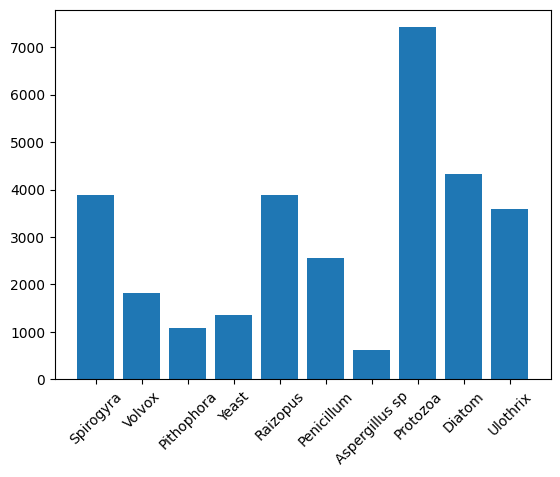

In [10]:
plt.bar(microorganisms,microorganisms_counts)
plt.xticks(rotation=45)
plt.show()

In [11]:
data= data[data.microorganisms !='Spirogyra']
data= data[data.microorganisms !='Penicillum']
data= data[data.microorganisms !='Pithophora']

In [12]:
microorganisms = data['microorganisms'].unique()
microorganisms_counts = data.groupby(['microorganisms']).size()
microorganisms.sort()
print(microorganisms)

['Aspergillus sp' 'Diatom' 'Protozoa' 'Raizopus' 'Ulothrix' 'Volvox'

 'Yeast']


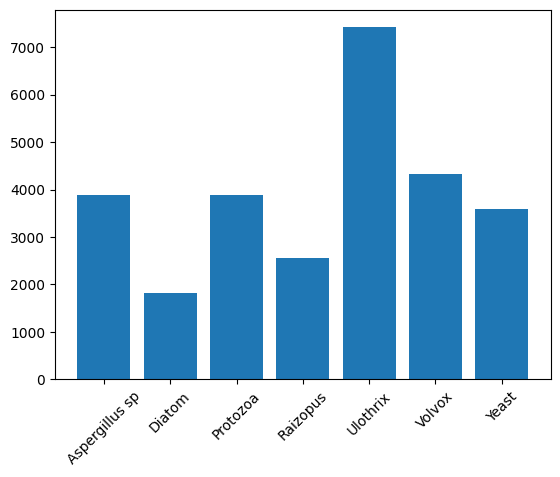

In [13]:
#Balance data
plt.bar(microorganisms,microorganisms_counts)
plt.xticks(rotation=45)
plt.show()

In [14]:
data['microorganisms'].value_counts()

Ulothrix          7420
Volvox            4320
Aspergillus sp    3888
Protozoa          3888
Yeast             3600
Raizopus          2552
Diatom            1818
Name: microorganisms, dtype: int64

In [15]:
#Applying undersampling
def undersampling(microCount, k=1818):
  if len(microCount) < k:
    return microCount
  return microCount.sample(k)

In [16]:
data_undersampled = data.groupby('microorganisms').apply(undersampling).reset_index(drop=True)
data_undersampled ['microorganisms'].value_counts()

Aspergillus sp    1818
Diatom            1818
Protozoa          1818
Raizopus          1818
Ulothrix          1818
Volvox            1818
Yeast             1818
Name: microorganisms, dtype: int64

In [17]:
data_undersampled

,Solidity,Eccentricity,EquivDiameter,Extrema,FilledArea,Extent,Orientation,EulerNumber,BoundingBox1,BoundingBox2,...,ConvexHull4,MajorAxisLength,MinorAxisLength,Perimeter,ConvexArea,Centroid1,Centroid2,Area,raddi,microorganisms
0,13.30,22.10,0.671,13.200,0.00898,8.37,9.52,23.0,13.3000,9.880,...,13.3000,0.222,0.0883,0.0511,0.00281,13.200,9.86,0.0233,0.633,Aspergillus sp
1,12.90,17.80,1.300,0.475,0.03440,7.71,14.80,23.0,0.0871,4.060,...,0.0871,0.280,0.2880,0.1070,0.00987,0.181,4.20,0.0799,1.580,Aspergillus sp
2,12.10,17.80,1.600,9.380,0.04720,7.55,15.60,22.9,9.1400,14.100,...,9.1500,0.369,0.3810,0.2570,0.01570,9.210,14.30,0.1190,2.030,Aspergillus sp
3,7.44,22.30,2.280,2.270,0.10300,3.03,19.30,22.2,1.1000,17.500,...,1.1000,1.180,0.4580,0.3180,0.05050,1.570,18.60,0.2370,5.810,Aspergillus sp
4,5.99,21.30,1.210,9.650,0.02880,4.05,9.18,22.9,9.5300,20.900,...,9.5300,0.551,0.3370,0.2260,0.01870,9.700,21.10,0.0708,1.030,Aspergillus sp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12721,13.90,20.90,3.590,20.100,0.27700,11.00,10.70,22.5,19.8000,16.900,...,19.9000,0.954,0.6470,0.3920,0.06680,20.500,17.20,0.5790,4.090,Yeast
12722,9.88,22.70,5.090,3.700,0.50900,4.37,1.78,22.1,3.3500,10.100,...,3.3500,2.680,0.7480,1.1600,0.18500,3.940,12.50,1.1500,7.950,Yeast
12723,10.80,9.28,4.430,1.740,0.44300,7.21,13.70,22.3,0.7110,0.600,...,0.7260,1.010,1.5400,0.5290,0.12900,1.350,1.60,0.8750,7.590,Yeast
12724,5.59,22.80,4.290,17.400,0.34000,1.83,14.50,22.1,13.0000,0.174,...,13.5000,3.000,0.6800,1.0500,0.23200,15.300,1.55,0.8210,9.150,Yeast


In [18]:
data_undersampled.shape

(12726, 25)

In [42]:
data_undersampled= data_undersampled.sample(frac = 1)
data_undersampled

,Solidity,Eccentricity,EquivDiameter,Extrema,FilledArea,Extent,Orientation,EulerNumber,BoundingBox1,BoundingBox2,...,ConvexHull4,MajorAxisLength,MinorAxisLength,Perimeter,ConvexArea,Centroid1,Centroid2,Area,raddi,microorganisms
9552,7.25,22.9,3.080,4.56,0.18400,2.36,20.70,22.2,3.26,9.19,...,3.29,2.1800,0.3490,0.6760,0.09380,3.83,11.30,0.42900,7.070,Volvox
9545,6.70,22.2,2.370,9.31,0.10100,3.56,7.75,22.8,8.95,19.60,...,8.95,1.2400,0.5230,0.4010,0.06080,9.62,20.10,0.25700,6.560,Volvox
6902,17.50,21.5,0.223,6.49,0.00131,9.66,13.90,23.0,6.46,20.00,...,6.51,0.0636,0.0277,0.0127,0.00032,6.28,19.90,0.00344,4.430,Raizopus
8488,11.00,22.8,2.580,17.70,0.13700,4.56,13.70,22.7,16.10,19.60,...,16.60,1.1500,0.2660,0.3630,0.04410,17.00,20.00,0.30300,4.100,Ulothrix
5142,15.10,22.3,0.644,6.11,0.00869,8.35,1.85,23.0,6.14,10.70,...,6.23,0.2150,0.0726,0.0491,0.00229,5.98,10.80,0.02160,0.660,Protozoa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3519,15.50,15.9,3.160,20.10,0.20300,10.90,3.30,22.6,19.90,10.00,...,19.90,0.6200,0.7400,0.2470,0.04640,20.10,10.70,0.45100,5.330,Diatom
11418,15.00,21.4,3.140,17.50,0.23000,8.03,15.60,22.8,16.50,7.16,...,16.50,0.9380,0.5600,0.2340,0.04750,17.00,7.68,0.44500,5.320,Yeast
11867,14.80,21.3,3.520,17.50,0.26100,6.79,15.40,22.8,16.50,7.16,...,16.50,0.9860,0.5990,0.3430,0.06010,17.00,7.68,0.55600,5.290,Yeast
5893,13.50,19.1,4.020,14.80,0.43800,8.66,14.30,22.6,13.70,10.20,...,13.70,1.1100,1.0200,0.2710,0.08570,14.30,10.90,0.72300,0.886,Raizopus


In [19]:
microorganisms = data_undersampled['microorganisms'].unique()
microorganisms_counts = data_undersampled.groupby(['microorganisms']).size()
print(microorganisms)

['Aspergillus sp' 'Diatom' 'Protozoa' 'Raizopus' 'Ulothrix' 'Volvox'

 'Yeast']


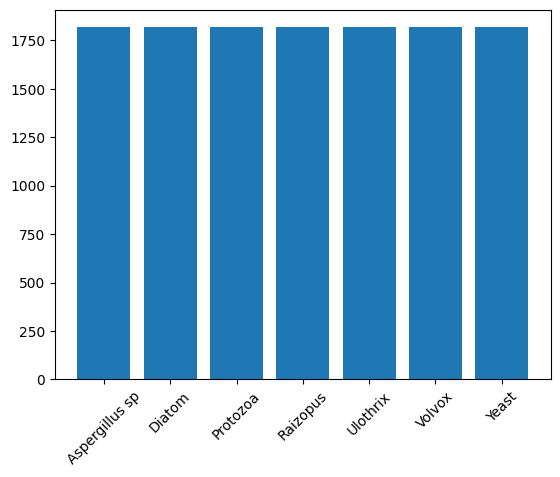

In [20]:
plt.bar(microorganisms,microorganisms_counts)
plt.xticks(rotation=45)
plt.show()

In [21]:
#Diaxwrismos ton dedomenwn apo tis klaseis
X=data_undersampled[data_undersampled.columns[:-1]] 
y=data_undersampled['microorganisms']

In [46]:
X_train, X_test, y_train, y_test = train_test_split(X, y,train_size=0.5,test_size=0.5,random_state = 0)

In [47]:
# features_train = X_train.astype('float32')
# features_test = X_test.astype('float32')

In [48]:
scaler = MinMaxScaler(feature_range=(-1, 1))
# scaler.fit(X_train)
features_scalar = scaler.fit_transform(X_train)
features_validation_scalar = scaler.transform(X_test)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 91 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure o

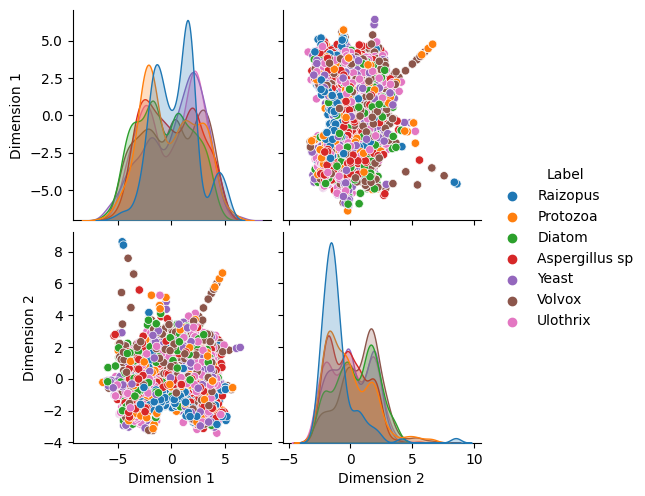

In [49]:
#Isometric Mapping
isomap = Isomap(n_neighbors=5, n_components=2)
#transform data
features_embedded = isomap.fit_transform(features_scalar)
embedded_labels = pd.DataFrame({'Dimension 1': features_embedded[: ,0], 'Dimension 2': features_embedded[: ,1],'Label':y_train})
sns.color_palette("tab10")
sns.pairplot(embedded_labels, hue='Label', palette="tab10")
plt.show()

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.

  warnings.warn(


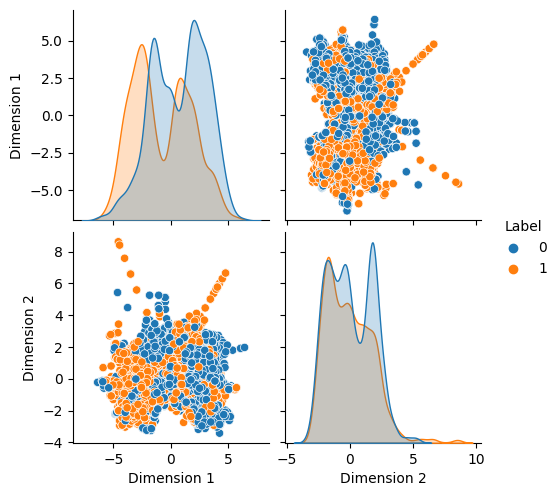

Clustering accuracy (homogeneity score):  0.028437115009758155

Clustering accuracy (silhouette score):  0.0570038382777056


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 93 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure o

training time: 0.0010006427764892578 s



Classification accuracy:  0.0 




c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.

  warnings.warn(


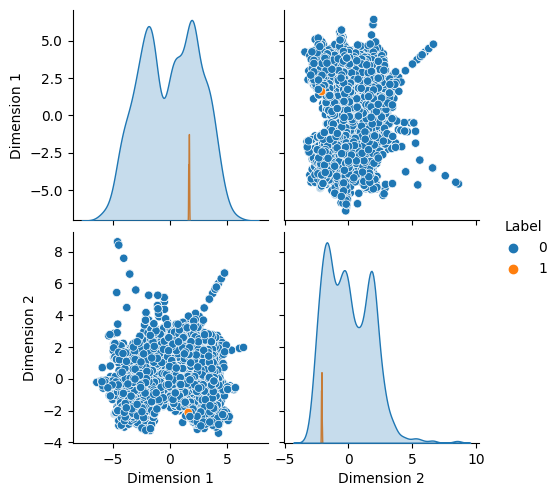

Clustering accuracy (homogeneity score):  0.2954282579011257

Clustering accuracy (silhouette score):  -0.08076388923277697


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 93 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure o

training time: 0.0009999275207519531 s



Classification accuracy:  0.0 




c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.

  warnings.warn(


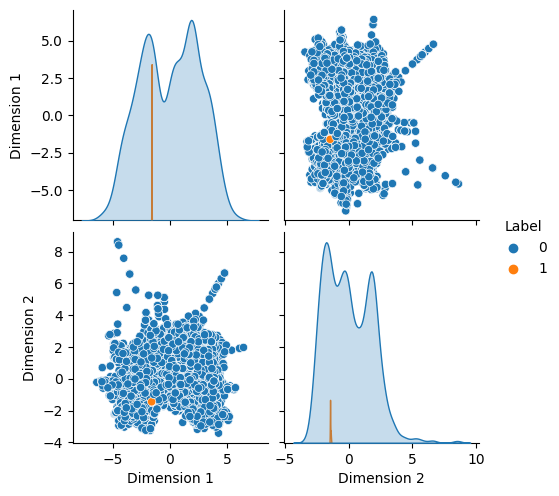

Clustering accuracy (homogeneity score):  0.17888885091437393

Clustering accuracy (silhouette score):  -0.1619655696718733


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 93 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure o

training time: 0.0009999275207519531 s



Classification accuracy:  0.0 




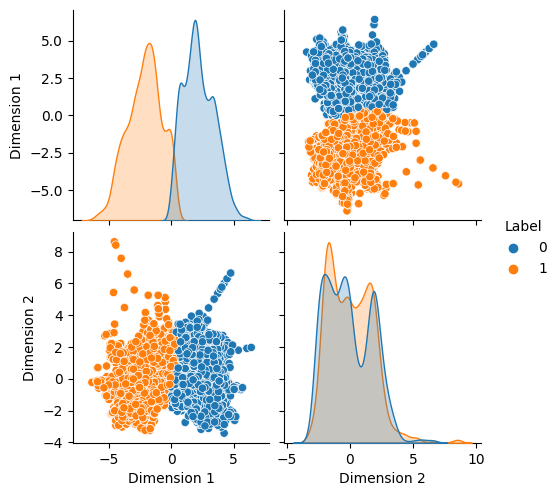

Clustering accuracy (homogeneity score):  0.3875083186738985

Clustering accuracy (silhouette score):  0.4331608868153848


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 93 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure o

training time: 0.0010001659393310547 s



Classification accuracy:  0.0 




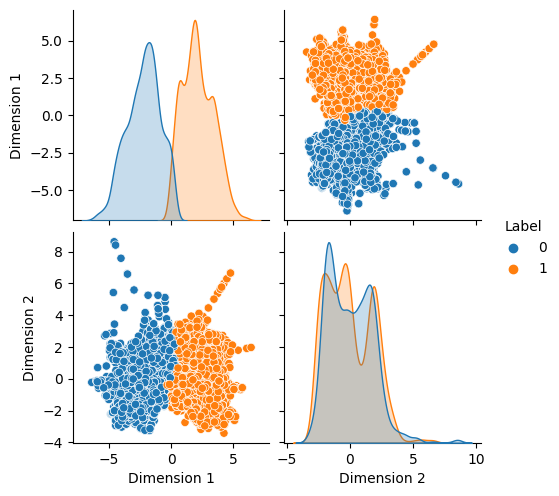

Clustering accuracy (homogeneity score):  0.34090198398062693

Clustering accuracy (silhouette score):  0.4340990105033118


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 93 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure o

training time: 0.0010001659393310547 s



Classification accuracy:  0.0 




In [50]:
#Spectral Clustering

for i in range(5,30,5):
    spectralClustering = SpectralClustering(n_clusters=2, affinity= 'nearest_neighbors', n_neighbors=i)
    spectralClustering.fit(features_embedded)
    predicted_labels = spectralClustering.labels_
    embedded_labels = pd.DataFrame({'Dimension 1': features_embedded[: ,0], 'Dimension 2': features_embedded[: ,1],'Label': predicted_labels})
    sns.pairplot(embedded_labels, hue='Label',palette="tab10")
    plt.show()

    #More accurate implementation, considering opposite labels
    accuracy = homogeneity_score(y_train, predicted_labels)
    print ('Clustering accuracy (homogeneity score): ',accuracy*100)

    silhouette = silhouette_score(features_embedded, predicted_labels)
    print('Clustering accuracy (silhouette score): ',silhouette)
    #clasify test_data 
    #dimension reduction #Isometric Mapping
    isomap = Isomap(n_neighbors=5, n_components=2)
    #transform data
    features_test_embedded = isomap.fit_transform(features_validation_scalar)
    
    clf = NearestCentroid()
    start_time=time.time()
    clf.fit(features_embedded, predicted_labels)
    end_time=time.time()
    print(f"training time: {end_time - start_time} s\n")
    predicted_labels = clf.predict(features_test_embedded)
    accuracy = accuracy_score(y_test, predicted_labels)		
    print ('Classification accuracy: ',accuracy*100, '\n')

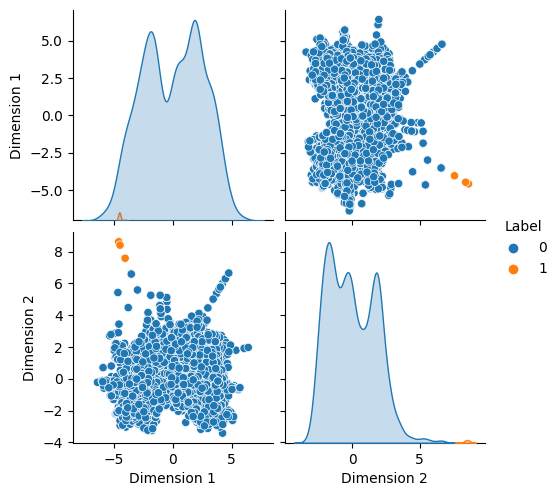

Clustering accuracy (homogeneity score):  0.1460185941377389

Clustering accuracy (silhouette score):  0.5913504739378231


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 93 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure o

training time: 0.0009989738464355469 s



Classification accuracy:  0.0 




In [51]:
spectralClustering = SpectralClustering(n_clusters=2, affinity= 'rbf')
spectralClustering.fit(features_embedded)
predicted_labels = spectralClustering.labels_
embedded_labels = pd.DataFrame({'Dimension 1': features_embedded[: ,0], 'Dimension 2': features_embedded[: ,1],'Label': predicted_labels})
sns.pairplot(embedded_labels, hue='Label',palette="tab10")
plt.show()

#More accurate implementation, considering opposite labels
accuracy = homogeneity_score(y_train, predicted_labels)
print ('Clustering accuracy (homogeneity score): ',accuracy*100)

silhouette = silhouette_score(features_embedded, predicted_labels)
print('Clustering accuracy (silhouette score): ',silhouette)
#clasify test_data 
#dimension reduction #Isometric Mapping
isomap = Isomap(n_neighbors=5, n_components=2)
#transform data
features_test_embedded = isomap.fit_transform(features_validation_scalar)
    
clf = NearestCentroid()
start_time=time.time()
clf.fit(features_embedded, predicted_labels)
end_time=time.time()
print(f"training time: {end_time - start_time} s\n")
predicted_labels = clf.predict(features_test_embedded)
accuracy = accuracy_score(y_test, predicted_labels)		
print ('Classification accuracy: ',accuracy*100, '\n')

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 6 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of

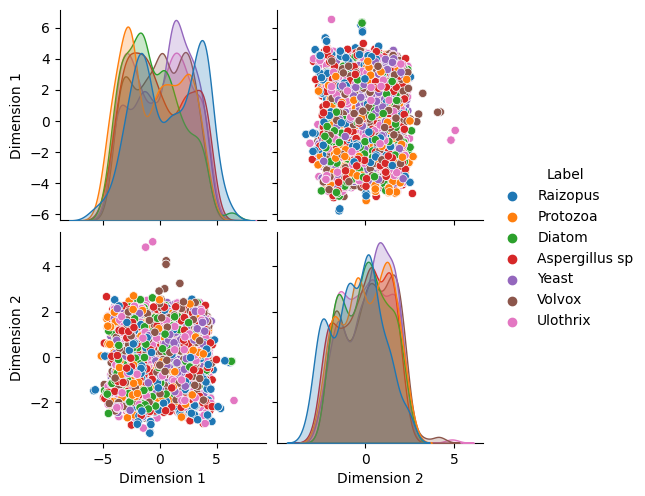

In [52]:
#Isometric Mapping
isomap = Isomap(n_neighbors=10, n_components=2)
#transform data
features_embedded = isomap.fit_transform(features_scalar)
embedded_labels = pd.DataFrame({'Dimension 1': features_embedded[: ,0], 'Dimension 2': features_embedded[: ,1],'Label':y_train})
sns.color_palette("tab10")
sns.pairplot(embedded_labels, hue='Label', palette="tab10")
plt.show()

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.

  warnings.warn(


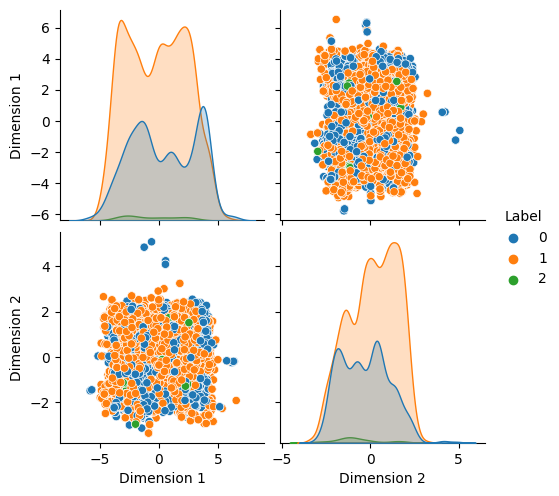

Clustering accuracy (homogeneity score):  0.2888713396126011

Clustering accuracy (silhouette score):  -0.05878106012497231


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 4 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of

training time: 0.0009999275207519531 s



Classification accuracy:  0.0 




c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.

  warnings.warn(


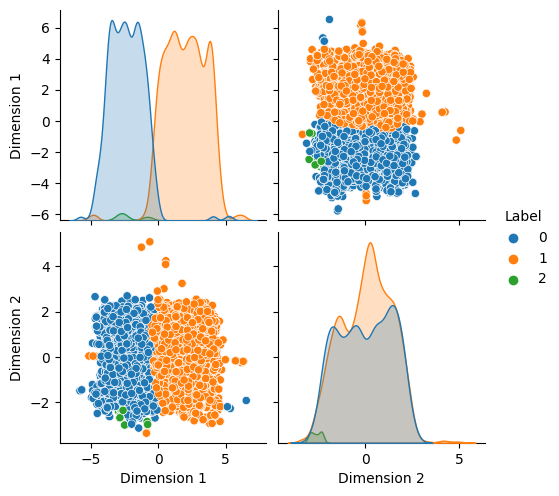

Clustering accuracy (homogeneity score):  0.5555494000572764

Clustering accuracy (silhouette score):  0.28932158096012145


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 4 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of

training time: 0.0010001659393310547 s



Classification accuracy:  0.0 




c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.

  warnings.warn(


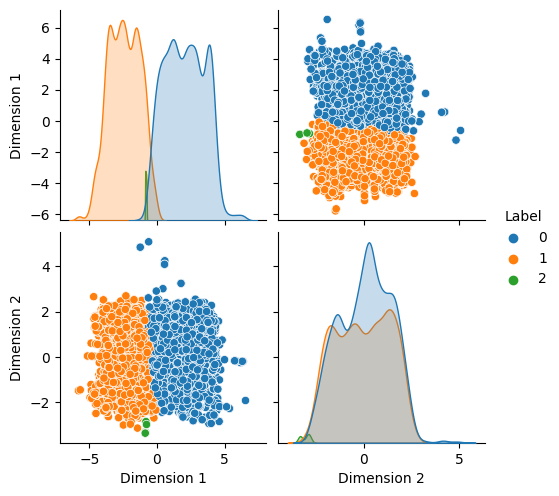

Clustering accuracy (homogeneity score):  0.7369481120602719

Clustering accuracy (silhouette score):  0.31469323330809346


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 4 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of

training time: 0.0010006427764892578 s



Classification accuracy:  0.0 




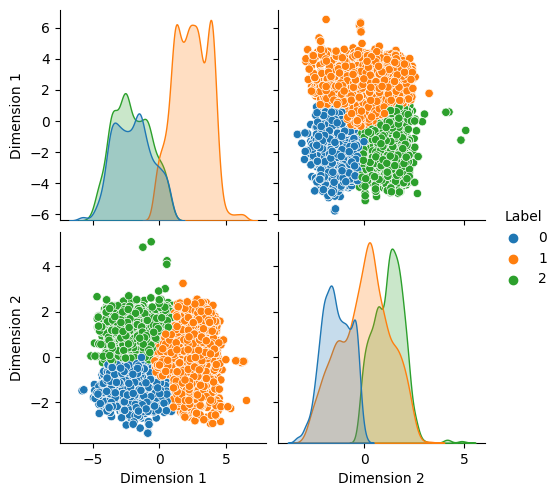

Clustering accuracy (homogeneity score):  0.4968036250003986

Clustering accuracy (silhouette score):  0.4006496919364504


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 4 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of

training time: 0.0010001659393310547 s



Classification accuracy:  0.0 




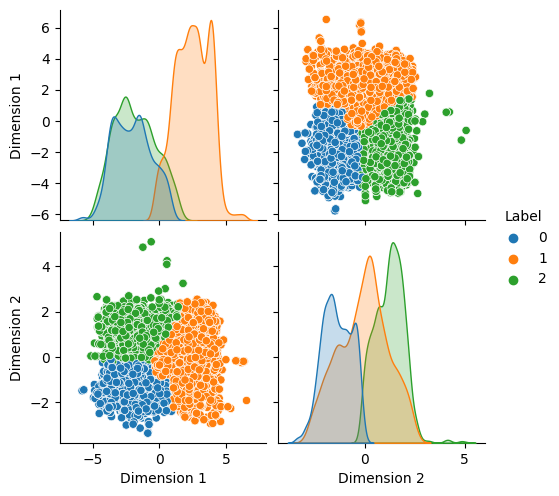

Clustering accuracy (homogeneity score):  0.6179168305360764

Clustering accuracy (silhouette score):  0.39075396124778944


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 4 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of

training time: 0.0009996891021728516 s



Classification accuracy:  0.0 




In [53]:
#Spectral Clustering

for i in range(5,30,5):
    spectralClustering = SpectralClustering(n_clusters=3, affinity= 'nearest_neighbors', n_neighbors=i)
    spectralClustering.fit(features_embedded)
    predicted_labels = spectralClustering.labels_
    embedded_labels = pd.DataFrame({'Dimension 1': features_embedded[: ,0], 'Dimension 2': features_embedded[: ,1],'Label': predicted_labels})
    sns.pairplot(embedded_labels, hue='Label',palette="tab10")
    plt.show()

    #More accurate implementation, considering opposite labels
    accuracy = homogeneity_score(y_train, predicted_labels)
    print ('Clustering accuracy (homogeneity score): ',accuracy*100)

    silhouette = silhouette_score(features_embedded, predicted_labels)
    print('Clustering accuracy (silhouette score): ',silhouette)
    #clasify test_data 
    #dimension reduction #Isometric Mapping
    isomap = Isomap(n_neighbors=10, n_components=2)
    #transform data
    features_test_embedded = isomap.fit_transform(features_validation_scalar)
    
    clf = NearestCentroid()
    start_time=time.time()
    clf.fit(features_embedded, predicted_labels)
    end_time=time.time()
    print(f"training time: {end_time - start_time} s\n")
    predicted_labels = clf.predict(features_test_embedded)
    accuracy = accuracy_score(y_test, predicted_labels)		
    print ('Classification accuracy: ',accuracy*100, '\n')

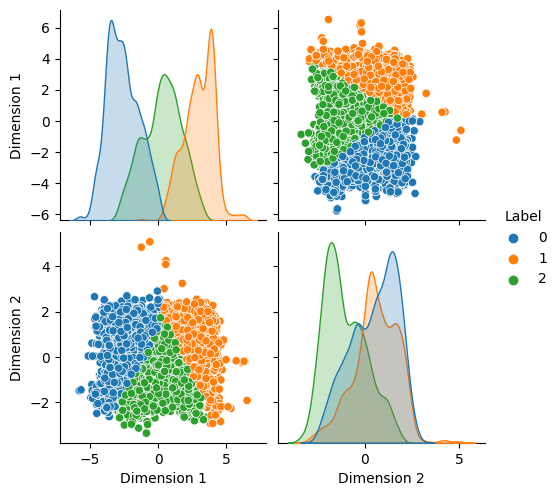

Clustering accuracy (homogeneity score):  0.5595185399962536

Clustering accuracy (silhouette score):  0.3635028155648064


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 4 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of

training time: 0.0010056495666503906 s



Classification accuracy:  0.0 




In [54]:
spectralClustering = SpectralClustering(n_clusters=3, affinity= 'rbf')
spectralClustering.fit(features_embedded)
predicted_labels = spectralClustering.labels_
embedded_labels = pd.DataFrame({'Dimension 1': features_embedded[: ,0], 'Dimension 2': features_embedded[: ,1],'Label': predicted_labels})
sns.pairplot(embedded_labels, hue='Label',palette="tab10")
plt.show()

#More accurate implementation, considering opposite labels
accuracy = homogeneity_score(y_train, predicted_labels)
print ('Clustering accuracy (homogeneity score): ',accuracy*100)

silhouette = silhouette_score(features_embedded, predicted_labels)
print('Clustering accuracy (silhouette score): ',silhouette)
#clasify test_data 
#dimension reduction #Isometric Mapping
isomap = Isomap(n_neighbors=10, n_components=2)
#transform data
features_test_embedded = isomap.fit_transform(features_validation_scalar)
    
clf = NearestCentroid()
start_time=time.time()
clf.fit(features_embedded, predicted_labels)
end_time=time.time()
print(f"training time: {end_time - start_time} s\n")
predicted_labels = clf.predict(features_test_embedded)
accuracy = accuracy_score(y_test, predicted_labels)		
print ('Classification accuracy: ',accuracy*100, '\n')

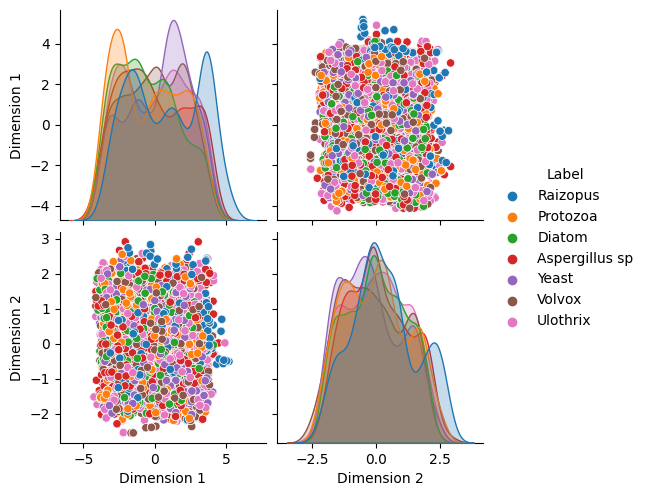

In [55]:
#Isometric Mapping
isomap = Isomap(n_neighbors=15, n_components=2)
#transform data
features_embedded = isomap.fit_transform(features_scalar)
embedded_labels = pd.DataFrame({'Dimension 1': features_embedded[: ,0], 'Dimension 2': features_embedded[: ,1],'Label':y_train})
sns.color_palette("tab10")
sns.pairplot(embedded_labels, hue='Label', palette="tab10")
plt.show()

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.

  warnings.warn(


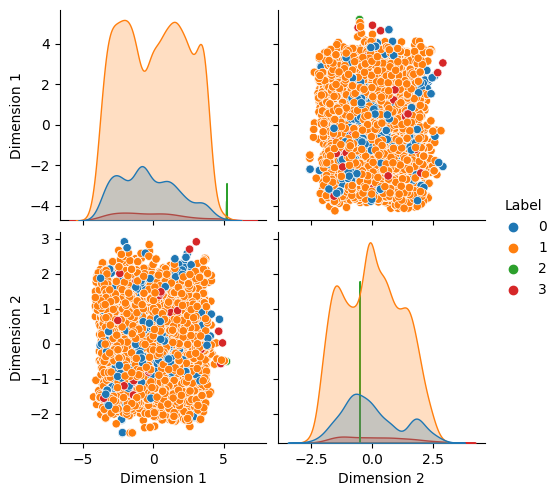

Clustering accuracy (homogeneity score):  0.5141341540984226

Clustering accuracy (silhouette score):  -0.11527147769527432


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])


training time: 0.0010004043579101562 s



Classification accuracy:  0.0 




c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.

  warnings.warn(


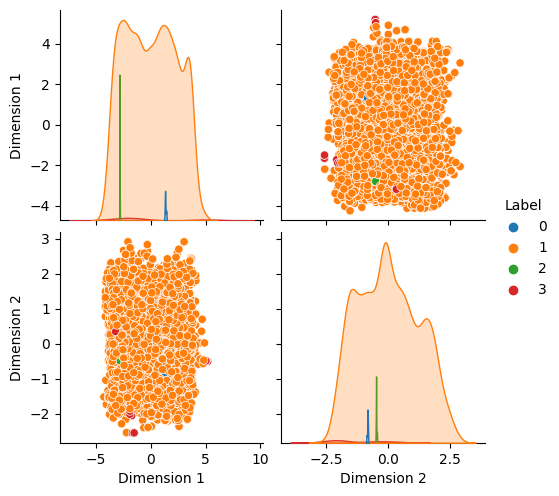

Clustering accuracy (homogeneity score):  0.5589222383210654

Clustering accuracy (silhouette score):  -0.45911766562891637


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])


training time: 0.0009999275207519531 s



Classification accuracy:  0.0 




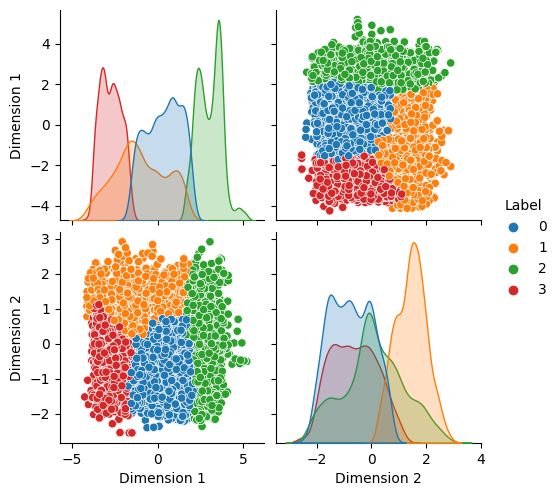

Clustering accuracy (homogeneity score):  1.0355328322653983

Clustering accuracy (silhouette score):  0.3570978404590273


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])


training time: 0.0009999275207519531 s



Classification accuracy:  0.0 




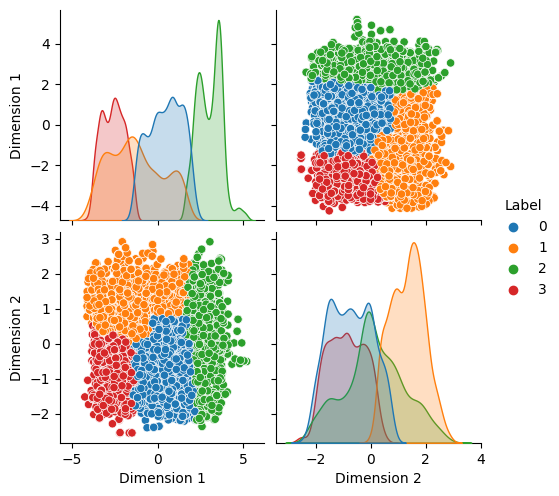

Clustering accuracy (homogeneity score):  1.000347653068487

Clustering accuracy (silhouette score):  0.34246715736538147


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])


training time: 0.0009999275207519531 s



Classification accuracy:  0.0 




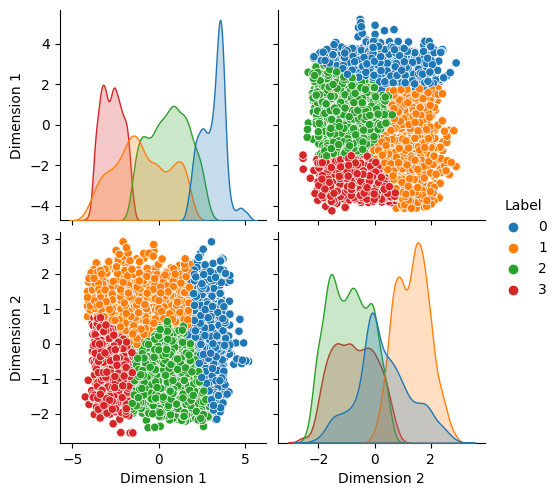

Clustering accuracy (homogeneity score):  1.1883197976253987

Clustering accuracy (silhouette score):  0.34068671688561


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])


training time: 0.0020003318786621094 s



Classification accuracy:  0.0 




In [56]:
#Spectral Clustering

for i in range(5,30,5):
    spectralClustering = SpectralClustering(n_clusters=4, affinity= 'nearest_neighbors', n_neighbors=i)
    spectralClustering.fit(features_embedded)
    predicted_labels = spectralClustering.labels_
    embedded_labels = pd.DataFrame({'Dimension 1': features_embedded[: ,0], 'Dimension 2': features_embedded[: ,1],'Label': predicted_labels})
    sns.pairplot(embedded_labels, hue='Label',palette="tab10")
    plt.show()

    #More accurate implementation, considering opposite labels
    accuracy = homogeneity_score(y_train, predicted_labels)
    print ('Clustering accuracy (homogeneity score): ',accuracy*100)

    silhouette = silhouette_score(features_embedded, predicted_labels)
    print('Clustering accuracy (silhouette score): ',silhouette)
    #clasify test_data 
    #dimension reduction #Isometric Mapping
    isomap = Isomap(n_neighbors=15, n_components=2)
    #transform data
    features_test_embedded = isomap.fit_transform(features_validation_scalar)
    
    clf = NearestCentroid()
    start_time=time.time()
    clf.fit(features_embedded, predicted_labels)
    end_time=time.time()
    print(f"training time: {end_time - start_time} s\n")
    predicted_labels = clf.predict(features_test_embedded)
    accuracy = accuracy_score(y_test, predicted_labels)		
    print ('Classification accuracy: ',accuracy*100, '\n')

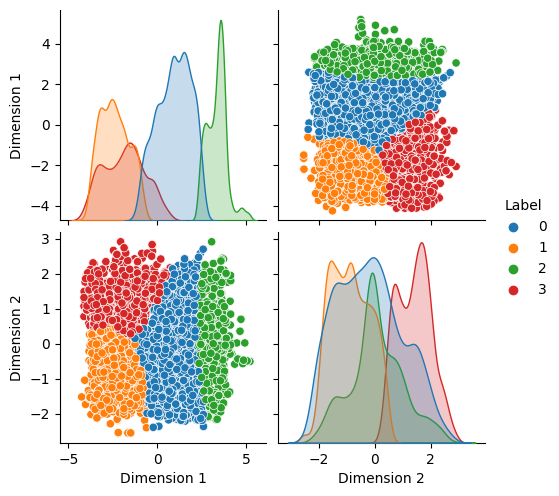

Clustering accuracy (homogeneity score):  0.8940995013839023

Clustering accuracy (silhouette score):  0.3479274689571084


c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

  self._fit_transform(X)

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

  self._set_intXint(row, col, x.flat[0])


training time: 0.002000093460083008 s



Classification accuracy:  0.0 




In [57]:
spectralClustering = SpectralClustering(n_clusters=4, affinity= 'rbf')
spectralClustering.fit(features_embedded)
predicted_labels = spectralClustering.labels_
embedded_labels = pd.DataFrame({'Dimension 1': features_embedded[: ,0], 'Dimension 2': features_embedded[: ,1],'Label': predicted_labels})
sns.pairplot(embedded_labels, hue='Label',palette="tab10")
plt.show()

#More accurate implementation, considering opposite labels
accuracy = homogeneity_score(y_train, predicted_labels)
print ('Clustering accuracy (homogeneity score): ',accuracy*100)

silhouette = silhouette_score(features_embedded, predicted_labels)
print('Clustering accuracy (silhouette score): ',silhouette)
#clasify test_data 
#dimension reduction #Isometric Mapping
isomap = Isomap(n_neighbors=15, n_components=2)
#transform data
features_test_embedded = isomap.fit_transform(features_validation_scalar)
    
clf = NearestCentroid()
start_time=time.time()
clf.fit(features_embedded, predicted_labels)
end_time=time.time()
print(f"training time: {end_time - start_time} s\n")
predicted_labels = clf.predict(features_test_embedded)
accuracy = accuracy_score(y_test, predicted_labels)		
print ('Classification accuracy: ',accuracy*100, '\n')

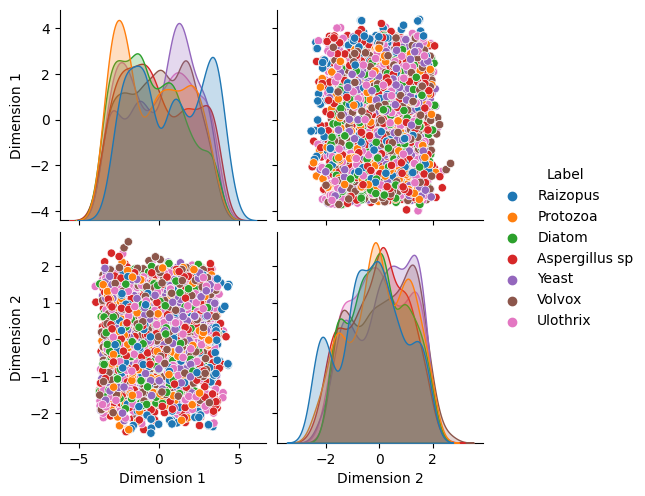

In [58]:
#Isometric Mapping
isomap = Isomap(n_neighbors=20, n_components=2)
#transform data
features_embedded = isomap.fit_transform(features_scalar)
embedded_labels = pd.DataFrame({'Dimension 1': features_embedded[: ,0], 'Dimension 2': features_embedded[: ,1],'Label':y_train})
sns.color_palette("tab10")
sns.pairplot(embedded_labels, hue='Label', palette="tab10")
plt.show()

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.

  warnings.warn(


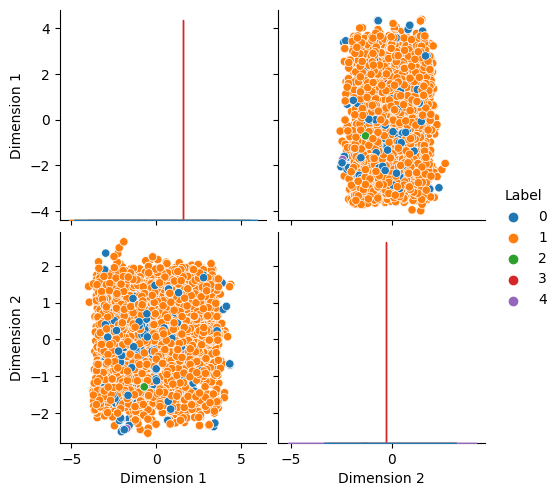

Clustering accuracy (homogeneity score):  0.6631327068836974

Clustering accuracy (silhouette score):  -0.4211708585232655

training time: 0.001001119613647461 s



Classification accuracy:  0.0 




c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.

  warnings.warn(


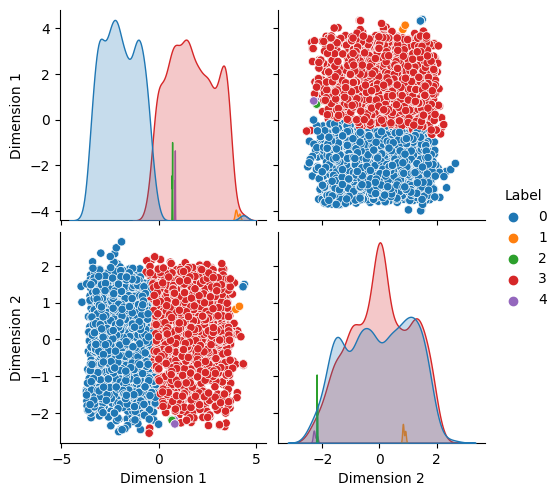

Clustering accuracy (homogeneity score):  0.7516564623865771

Clustering accuracy (silhouette score):  0.13651245631537154

training time: 0.0010004043579101562 s



Classification accuracy:  0.0 




c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.

  warnings.warn(


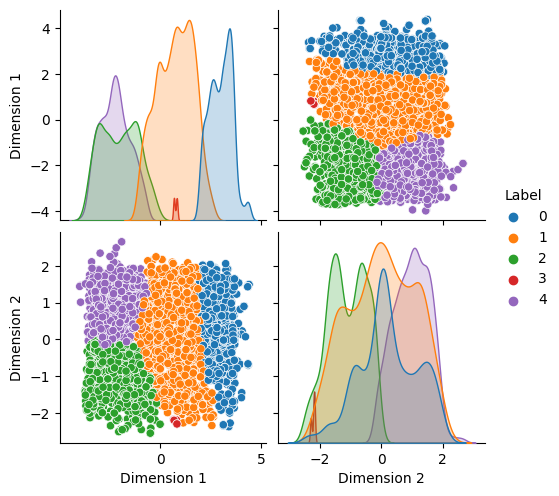

Clustering accuracy (homogeneity score):  0.9549025898995824

Clustering accuracy (silhouette score):  0.2676602273119322

training time: 0.0020003318786621094 s



Classification accuracy:  0.0 




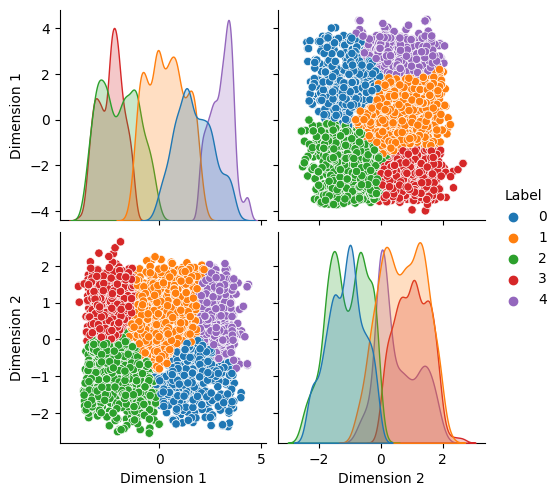

Clustering accuracy (homogeneity score):  1.1120637323165947

Clustering accuracy (silhouette score):  0.363765343715485

training time: 0.0009999275207519531 s



Classification accuracy:  0.0 




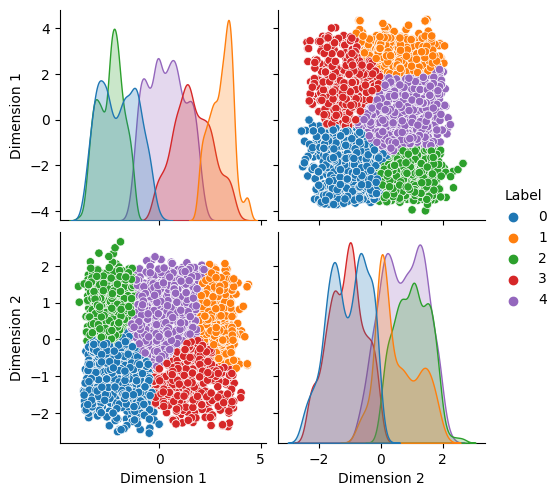

Clustering accuracy (homogeneity score):  1.0011398496348567

Clustering accuracy (silhouette score):  0.3653395026917905

training time: 0.0010027885437011719 s



Classification accuracy:  0.0 




In [59]:
#Spectral Clustering

for i in range(5,30,5):
    spectralClustering = SpectralClustering(n_clusters=5, affinity= 'nearest_neighbors', n_neighbors=i)
    spectralClustering.fit(features_embedded)
    predicted_labels = spectralClustering.labels_
    embedded_labels = pd.DataFrame({'Dimension 1': features_embedded[: ,0], 'Dimension 2': features_embedded[: ,1],'Label': predicted_labels})
    sns.pairplot(embedded_labels, hue='Label',palette="tab10")
    plt.show()

    #More accurate implementation, considering opposite labels
    accuracy = homogeneity_score(y_train, predicted_labels)
    print ('Clustering accuracy (homogeneity score): ',accuracy*100)

    silhouette = silhouette_score(features_embedded, predicted_labels)
    print('Clustering accuracy (silhouette score): ',silhouette)
    #clasify test_data 
    #dimension reduction #Isometric Mapping
    isomap = Isomap(n_neighbors=20, n_components=2)
    #transform data
    features_test_embedded = isomap.fit_transform(features_validation_scalar)
    
    clf = NearestCentroid()
    start_time=time.time()
    clf.fit(features_embedded, predicted_labels)
    end_time=time.time()
    print(f"training time: {end_time - start_time} s\n")
    predicted_labels = clf.predict(features_test_embedded)
    accuracy = accuracy_score(y_test, predicted_labels)		
    print ('Classification accuracy: ',accuracy*100, '\n')

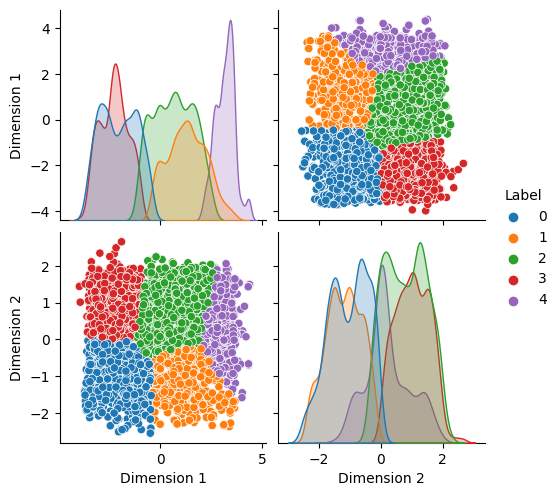

Clustering accuracy (homogeneity score):  1.122552701498751

Clustering accuracy (silhouette score):  0.36529519137201366

training time: 0.002000093460083008 s



Classification accuracy:  0.0 




In [60]:
spectralClustering = SpectralClustering(n_clusters=5, affinity= 'rbf')
spectralClustering.fit(features_embedded)
predicted_labels = spectralClustering.labels_
embedded_labels = pd.DataFrame({'Dimension 1': features_embedded[: ,0], 'Dimension 2': features_embedded[: ,1],'Label': predicted_labels})
sns.pairplot(embedded_labels, hue='Label',palette="tab10")
plt.show()

#More accurate implementation, considering opposite labels
accuracy = homogeneity_score(y_train, predicted_labels)
print ('Clustering accuracy (homogeneity score): ',accuracy*100)

silhouette = silhouette_score(features_embedded, predicted_labels)
print('Clustering accuracy (silhouette score): ',silhouette)
#clasify test_data 
#dimension reduction #Isometric Mapping
isomap = Isomap(n_neighbors=20, n_components=2)
#transform data
features_test_embedded = isomap.fit_transform(features_validation_scalar)
    
clf = NearestCentroid()
start_time=time.time()
clf.fit(features_embedded, predicted_labels)
end_time=time.time()
print(f"training time: {end_time - start_time} s\n")
predicted_labels = clf.predict(features_test_embedded)
accuracy = accuracy_score(y_test, predicted_labels)		
print ('Classification accuracy: ',accuracy*100, '\n')

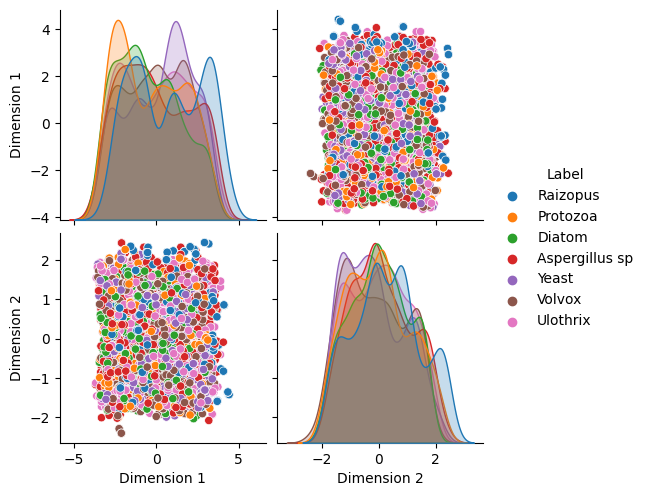

In [61]:
#Isometric Mapping
isomap = Isomap(n_neighbors=25, n_components=2)
#transform data
features_embedded = isomap.fit_transform(features_scalar)
embedded_labels = pd.DataFrame({'Dimension 1': features_embedded[: ,0], 'Dimension 2': features_embedded[: ,1],'Label':y_train})
sns.color_palette("tab10")
sns.pairplot(embedded_labels, hue='Label', palette="tab10")
plt.show()

c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.

  warnings.warn(


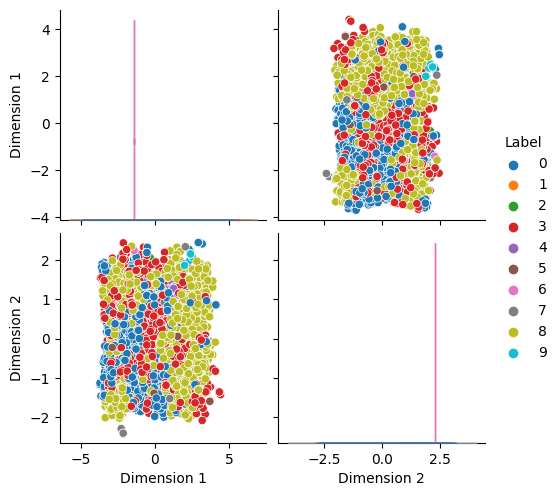

Clustering accuracy (homogeneity score):  0.9685150031250576

Clustering accuracy (silhouette score):  -0.451333277895786

training time: 0.000997781753540039 s



Classification accuracy:  0.0 




c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.

  warnings.warn(


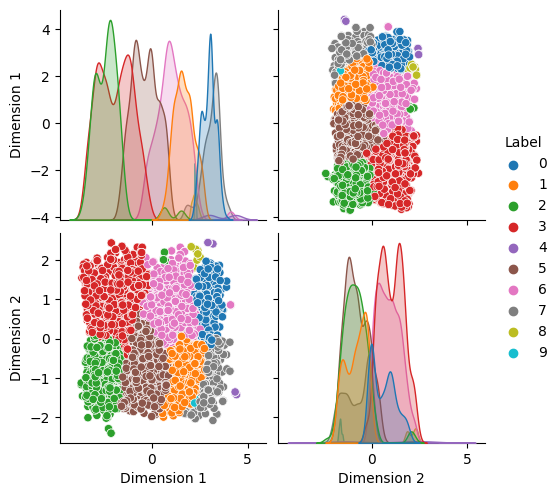

Clustering accuracy (homogeneity score):  2.396923469744717

Clustering accuracy (silhouette score):  0.22899476976064118

training time: 0.0020008087158203125 s



Classification accuracy:  0.0 




c:\Users\eimai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.

  warnings.warn(


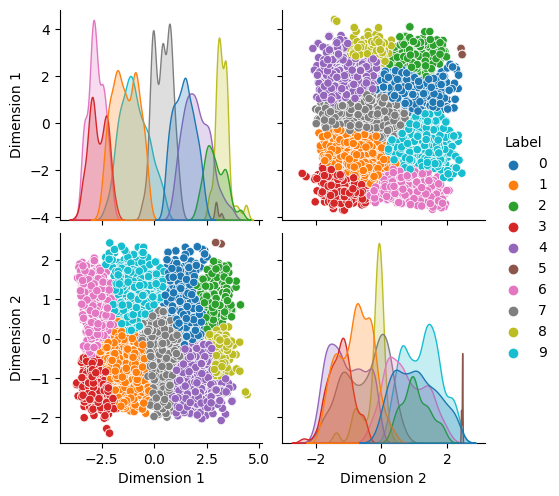

Clustering accuracy (homogeneity score):  2.645622182219603

Clustering accuracy (silhouette score):  0.3312294859664182

training time: 0.002000093460083008 s



Classification accuracy:  0.0 




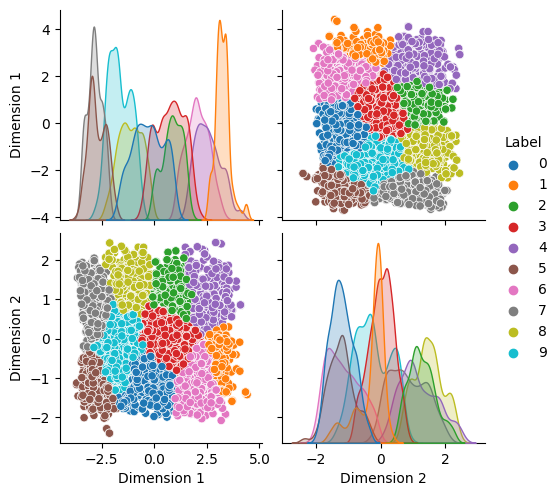

Clustering accuracy (homogeneity score):  2.379190976097813

Clustering accuracy (silhouette score):  0.3381171816267357

training time: 0.0019996166229248047 s



Classification accuracy:  0.0 




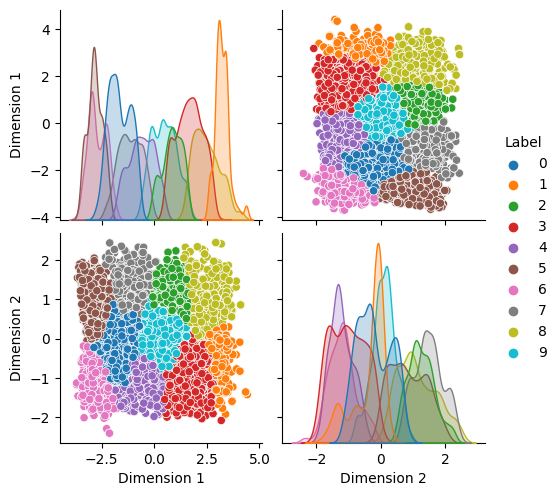

Clustering accuracy (homogeneity score):  2.1963778701575674

Clustering accuracy (silhouette score):  0.34518222376314117

training time: 0.0020003318786621094 s



Classification accuracy:  0.0 




In [62]:
#Spectral Clustering

for i in range(5,30,5):
    spectralClustering = SpectralClustering(n_clusters=10, affinity= 'nearest_neighbors', n_neighbors=i)
    spectralClustering.fit(features_embedded)
    predicted_labels = spectralClustering.labels_
    embedded_labels = pd.DataFrame({'Dimension 1': features_embedded[: ,0], 'Dimension 2': features_embedded[: ,1],'Label': predicted_labels})
    sns.pairplot(embedded_labels, hue='Label',palette="tab10")
    plt.show()

    #More accurate implementation, considering opposite labels
    accuracy = homogeneity_score(y_train, predicted_labels)
    print ('Clustering accuracy (homogeneity score): ',accuracy*100)

    silhouette = silhouette_score(features_embedded, predicted_labels)
    print('Clustering accuracy (silhouette score): ',silhouette)
    #clasify test_data 
    #dimension reduction #Isometric Mapping
    isomap = Isomap(n_neighbors=25, n_components=2)
    #transform data
    features_test_embedded = isomap.fit_transform(features_validation_scalar)
    
    clf = NearestCentroid()
    start_time=time.time()
    clf.fit(features_embedded, predicted_labels)
    end_time=time.time()
    print(f"training time: {end_time - start_time} s\n")
    predicted_labels = clf.predict(features_test_embedded)
    accuracy = accuracy_score(y_test, predicted_labels)		
    print ('Classification accuracy: ',accuracy*100, '\n')

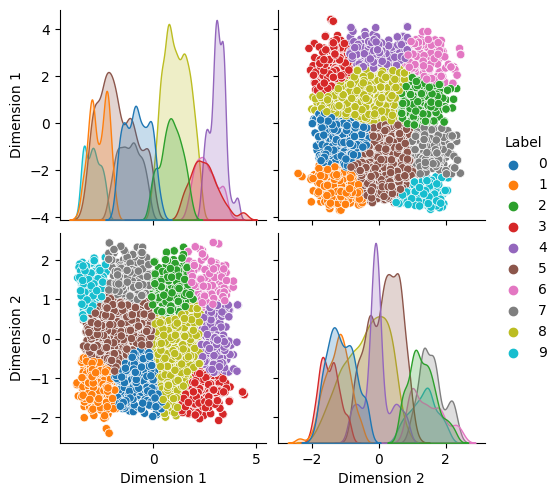

Clustering accuracy (homogeneity score):  2.3820101567309524

Clustering accuracy (silhouette score):  0.3060788357541

training time: 0.0019998550415039062 s



Classification accuracy:  0.0 




In [63]:
spectralClustering = SpectralClustering(n_clusters=10, affinity= 'rbf')
spectralClustering.fit(features_embedded)
predicted_labels = spectralClustering.labels_
embedded_labels = pd.DataFrame({'Dimension 1': features_embedded[: ,0], 'Dimension 2': features_embedded[: ,1],'Label': predicted_labels})
sns.pairplot(embedded_labels, hue='Label',palette="tab10")
plt.show()

#More accurate implementation, considering opposite labels
accuracy = homogeneity_score(y_train, predicted_labels)
print ('Clustering accuracy (homogeneity score): ',accuracy*100)

silhouette = silhouette_score(features_embedded, predicted_labels)
print('Clustering accuracy (silhouette score): ',silhouette)
#clasify test_data 
#dimension reduction #Isometric Mapping
isomap = Isomap(n_neighbors=25, n_components=2)
#transform data
features_test_embedded = isomap.fit_transform(features_validation_scalar)
    
clf = NearestCentroid()
start_time=time.time()
clf.fit(features_embedded, predicted_labels)
end_time=time.time()
print(f"training time: {end_time - start_time} s\n")
predicted_labels = clf.predict(features_test_embedded)
accuracy = accuracy_score(y_test, predicted_labels)		
print ('Classification accuracy: ',accuracy*100, '\n')